# MAST Data

Given the apparant success of DeepMatching with the KL11 data, the obvious next step is to see if the results will generalise to other views. In this notebook, we assess whether DeepMatching can handle continguous frames from a MAST plasma shot. 

Note it is not clear whether DeepFlow (a technique for optical flow based on DeepMatching)

In [11]:
from os import path

import numpy as np
import pandas as pd

import cv2 as cv

import matplotlib.pyplot as plt

In [12]:
def plot_two(img_a, name_a, img_b, name_b):
    plt.figure(1, figsize=(13,13))
    
    plt.subplot(121)
    plt.title(name_a)
    plt.imshow(img_a)

    plt.subplot(122)
    plt.title(name_b)
    plt.imshow(img_b)
    
    plt.show()

    
def overlay(img_1, img_2):
    
    if len(img_1.shape) == 3:
        overlay = np.zeros_like(img_1, dtype='uint8')
    else:
        overlay = np.zeros((img_1.shape[0], img_1.shape[1], 3), dtype='uint8')

    overlay[:,:,0] = img_1
    overlay[:,:,1] = img_2
    
    return overlay

def correct_contrast(img, clip_limit=3, tile_size=7):
    
    # create the object
    clahe = cv.createCLAHE(clipLimit=clip_limit, 
                            tileGridSize=(tile_size, tile_size))
    
    # apply equalisation
    return clahe.apply(img)

# Read Input

For convenience, we pull every frame of the .ipx file and save it.

{'size': 21236, 'time_stamp': -0.009975999999999999}




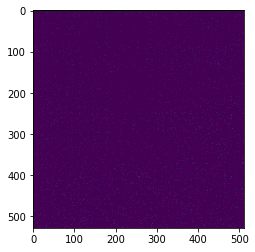

In [4]:
from pyIpx.movieReader import ipxReader
import matplotlib.pyplot as plt
plt.ion()

reader = ipxReader("rbb023383.ipx")

frame_ok,frame_data,metadata = reader.read()
print(metadata)
implot = plt.imshow(frame_data)
plt.draw()

next_frame_ok = True
frames = []

# this will read each frame into a Python list
# uncomment lines to display the video
while next_frame_ok:
    frames.append(frame_data)
    # Update the plot and colour map
    #implot.set_data(frame_data)
    #implot.set_clim([frame_data.min(),frame_data.max()])
    #plt.title('Time: {:.1f} ms '.format(metadata['time_stamp']*1000))
    #plt.draw()
    #plt.pause(0.01)
    # Read the next frame from the file
    next_frame_ok,frame_data,metadata = reader.read()

Write out each frame to an image to save having to deal with the `.ipx` in future. 

In [5]:
frames = np.asarray(frames)
print(frames.shape) # indexed as frame, (coords)

step = 1
for i in range(0, 451, step):
    fname = f'../data/real/MAST/pulse-1/{i}.png'

cv.imwrite(fname, frames[i])

(451, 528, 512)

# Testing the Feasibility of DeepMatching on MAST

First lets DeepMatch a random frame and see if we can get good enough results to perform a sensible matching. Given all the plasma in the image, it might be more tricky than for KL11.

In the following example, frame 366 was used as the first frame.

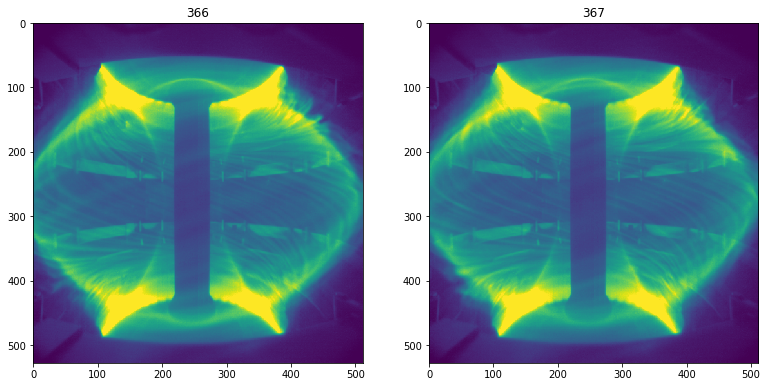

In [126]:
frame_1_id = np.random.choice(frames.shape[0], 1, replace=False)[0]
frame_2_id = frame_1_id + 1

frame_1 = frames[frame_1_id]
frame_2 = frames[frame_2_id]

plot_two(frame_1, frame_1_id, frame_2, frame_2_id)

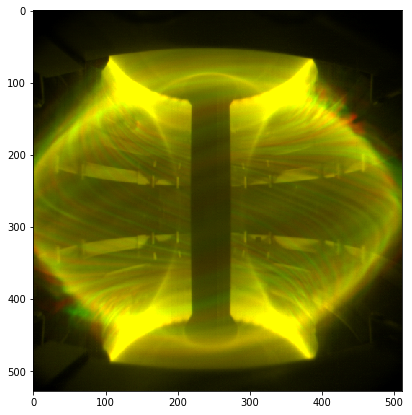

In [127]:
plt.figure(figsize=(7,7))
plt.imshow(overlay(frame_1, frame_2))

Between individual frames, the only thing that is changing significantly is the plasma.

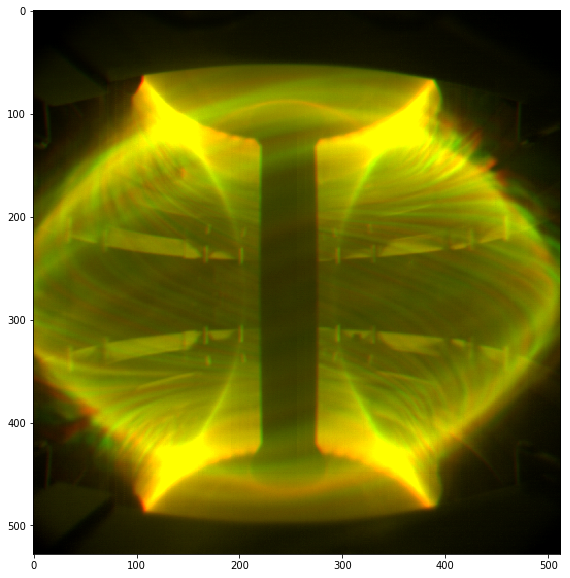

In [135]:
frame_2_id = frame_1_id + 10

frame_1 = frames[frame_1_id]
frame_2 = frames[frame_2_id]

plt.figure(figsize=(10,10))
plt.imshow(overlay(frame_1, frame_2))

With a few more frames of displacement, we see red and green fringes on the central column. These are the kind of thing we want to correct for. Let's save these so we can perform a DeepMatch

In [139]:
cv.imwrite('mast_im1.png', frame_1)
cv.imwrite('mast_im1+10.png', frame_2)

True

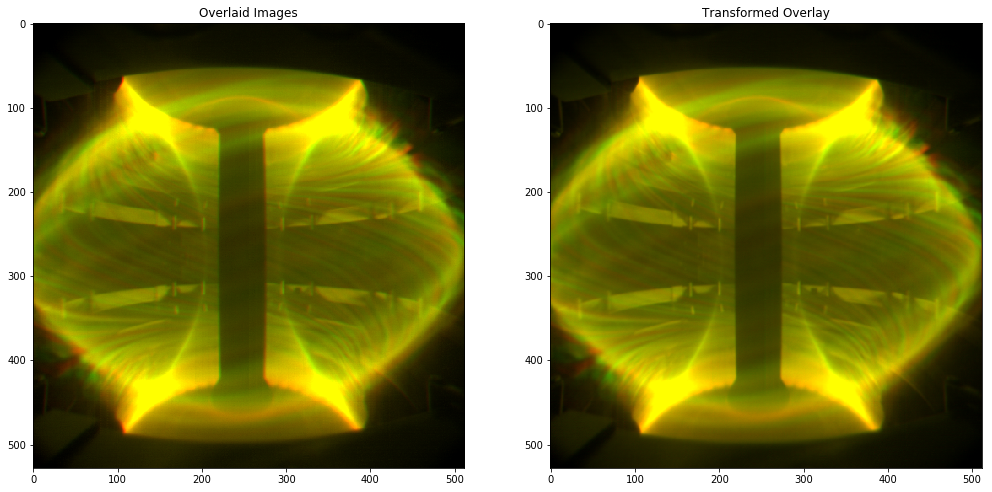

In [202]:
img_1 = cv.imread('tests/mast_im1.png', cv.IMREAD_GRAYSCALE)
img_2 = cv.imread('tests/mast_im1+10.png', cv.IMREAD_GRAYSCALE)

df = pd.read_csv('tests/mast_im1--mast_im1+10.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

# note here we reverse the order of the homography
# as these frames would be played chronologically
h_matrix, mask = cv.findHomography(after, before, method=cv.LMEDS)
transformed_img = cv.warpPerspective(img_2, h_matrix, dsize=(img_1.shape[1], img_1.shape[0]))

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(img_1, transformed_img))

plt.show()

Fringes on the colum have been successfully removed.

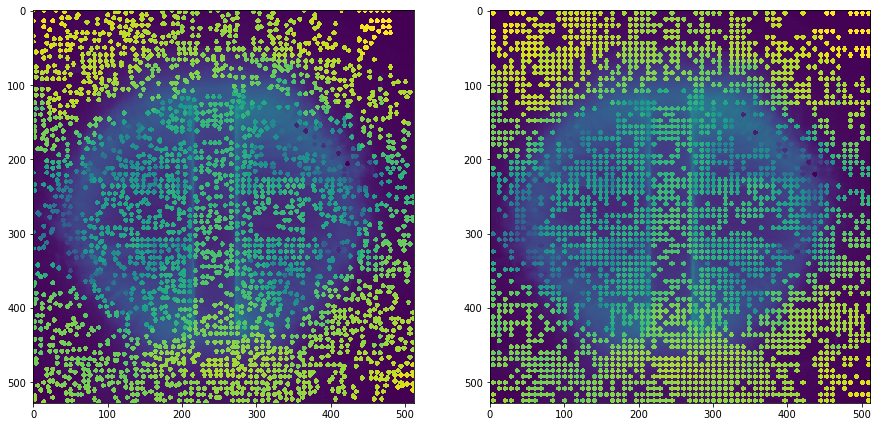

In [224]:
before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values
cs = df['score'].values

def translate(value, leftMin, leftMax, rightMin, rightMax):
    # Figure out how 'wide' each range is
    leftSpan = leftMax - leftMin
    rightSpan = rightMax - rightMin

    # Convert the left range into a 0-1 range (float)
    valueScaled = float(value - leftMin) / float(leftSpan)

    # Convert the 0-1 range into a value in the right range.
    return rightMin + (valueScaled * rightSpan)

cs = [translate(c, cs.min(), cs.max(), 0, 255) for c in cs]

#colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(sampled))]
colors = [(c, c, c) for c in cs]

# plot the anchors over some image
img_1_copy = np.copy(img_1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv.circle(img_1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
img_2_copy = np.copy(img_2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv.circle(img_2_copy, (x,y), 2, c, 2)
    
plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(img_1_copy)
plt.subplot(122)
plt.imshow(img_2_copy)

Interesting to know that DeepMatching is less confident about point pairs in plasma regions. However it could be argued that it is overly confident in dark, featureless regions of the image.

Let's zoom in a bit.

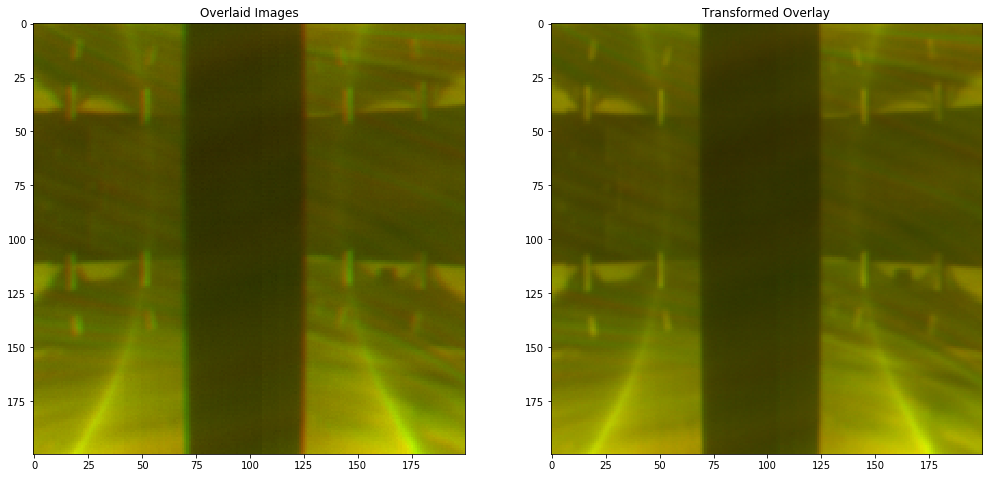

In [203]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2)[200:400, 150:350])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(img_1, transformed_img)[200:400, 150:350])

plt.show()

Zoom in and boost contrast so we can see differences more easily.

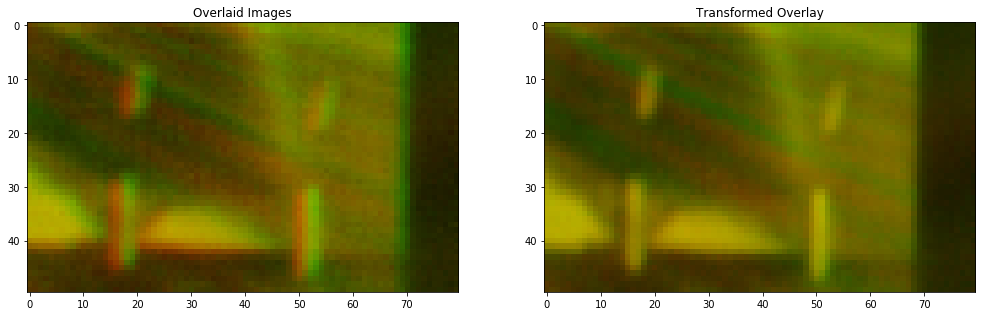

In [205]:
img_1_c = correct_contrast(img_1)
img_2_c = correct_contrast(img_2)
transformed_img_c = correct_contrast(transformed_img)


plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1_c, img_2_c)[200:250, 150:230])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(img_1_c, transformed_img_c)[200:250, 150:230])

plt.show()

The components in the backgroun loose their red/green fringes - impressive! Note this result is without any preprocessing at all!

## Some more test examples...

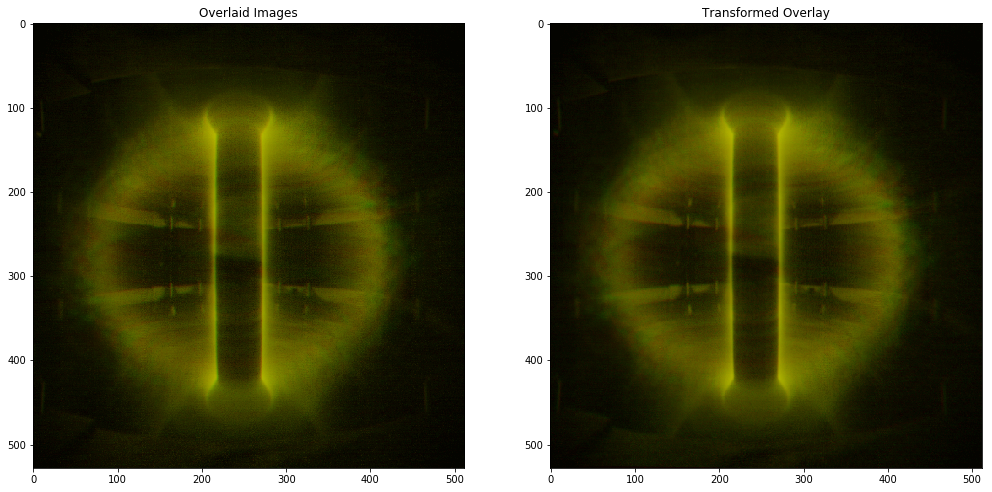

In [237]:
frame_num = 29

img_1 = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
img_2 = cv.imread(f'frames/1/frame_{frame_num+1}.png', cv.IMREAD_GRAYSCALE)

df = pd.read_csv(f'tests/1/{frame_num}_to_{frame_num+1}.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

# note here we reverse the order of the homography
# as these frames would be played chronologically
h_matrix, mask = cv.findHomography(after, before, method=cv.LMEDS)
transformed_img = cv.warpPerspective(img_2, h_matrix, dsize=(img_1.shape[1], img_1.shape[0]))

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(img_2)))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(transformed_img)))

plt.show()

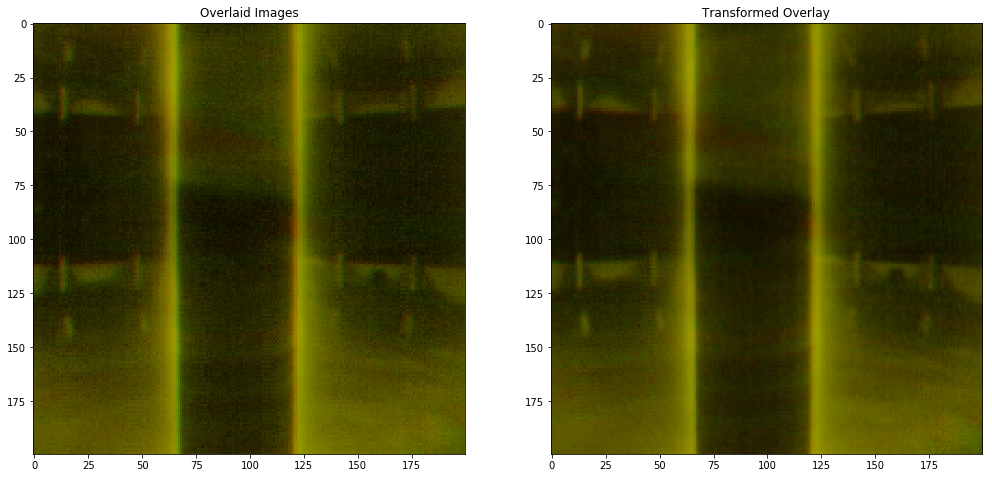

In [238]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(img_2))[200:400, 150:350])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(transformed_img))[200:400, 150:350])

plt.show()

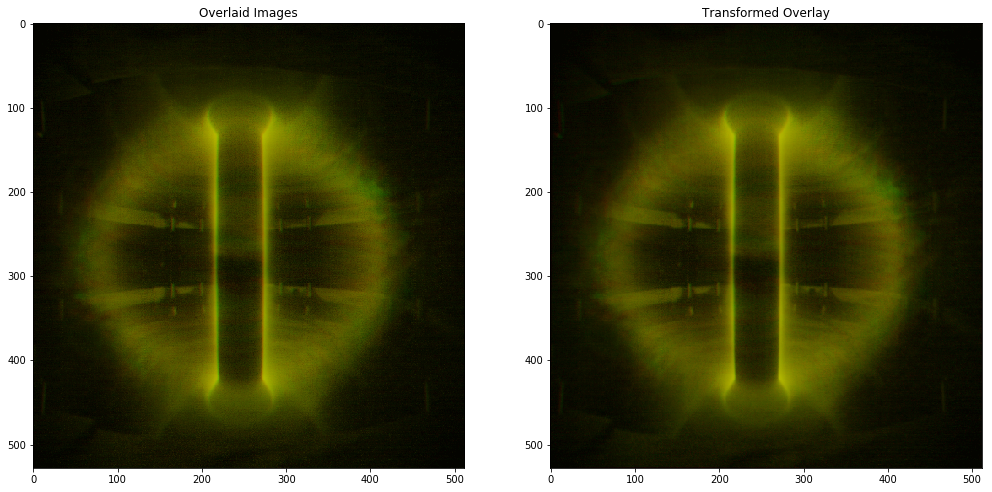

In [245]:
frame_num = 30

img_1 = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
img_2 = cv.imread(f'frames/1/frame_{frame_num+1}.png', cv.IMREAD_GRAYSCALE)

df = pd.read_csv(f'tests/1/{frame_num}_to_{frame_num+1}.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

# note here we reverse the order of the homography
# as these frames would be played chronologically
h_matrix, mask = cv.findHomography(after, before, method=cv.RANSAC)
transformed_img = cv.warpPerspective(img_2, h_matrix, dsize=(img_1.shape[1], img_1.shape[0]))

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(img_2)))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(transformed_img)))

plt.show()

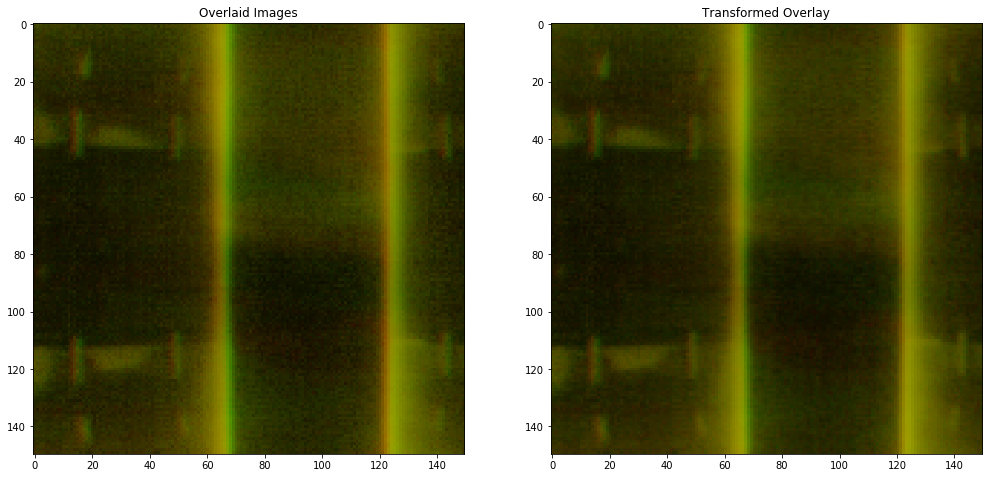

In [246]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(img_2))[200:350, 150:300])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(transformed_img))[200:350, 150:300])

plt.show()

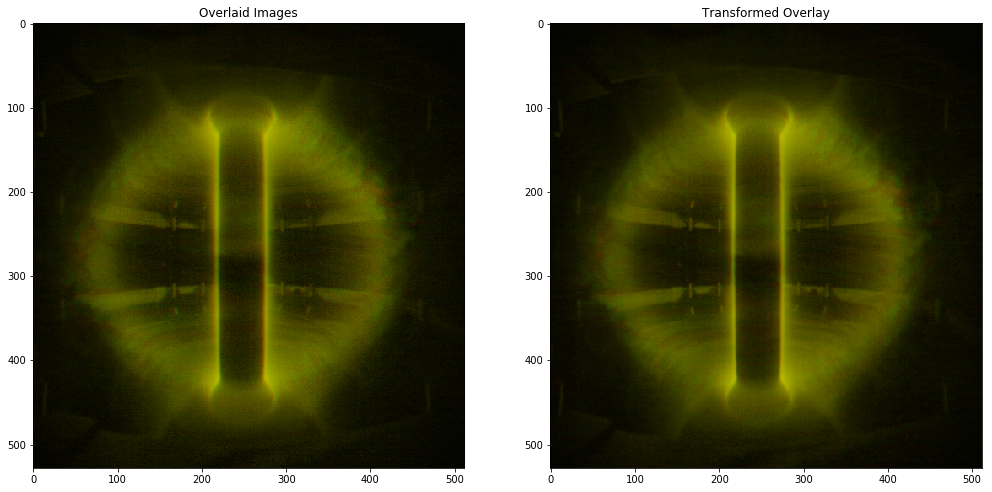

In [241]:
frame_num = 31

img_1 = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
img_2 = cv.imread(f'frames/1/frame_{frame_num+1}.png', cv.IMREAD_GRAYSCALE)

df = pd.read_csv(f'tests/1/{frame_num}_to_{frame_num+1}.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

# note here we reverse the order of the homography
# as these frames would be played chronologically
h_matrix, mask = cv.findHomography(after, before, method=cv.LMEDS)
transformed_img = cv.warpPerspective(img_2, h_matrix, dsize=(img_1.shape[1], img_1.shape[0]))

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(img_2)))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(transformed_img)))

plt.show()

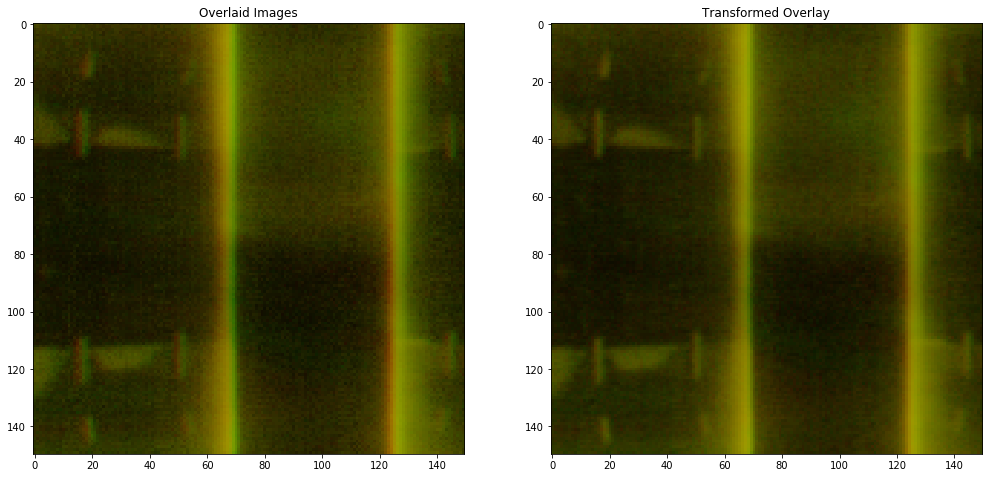

In [242]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(img_2))[200:350, 150:300])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(transformed_img))[200:350, 150:300])

plt.show()

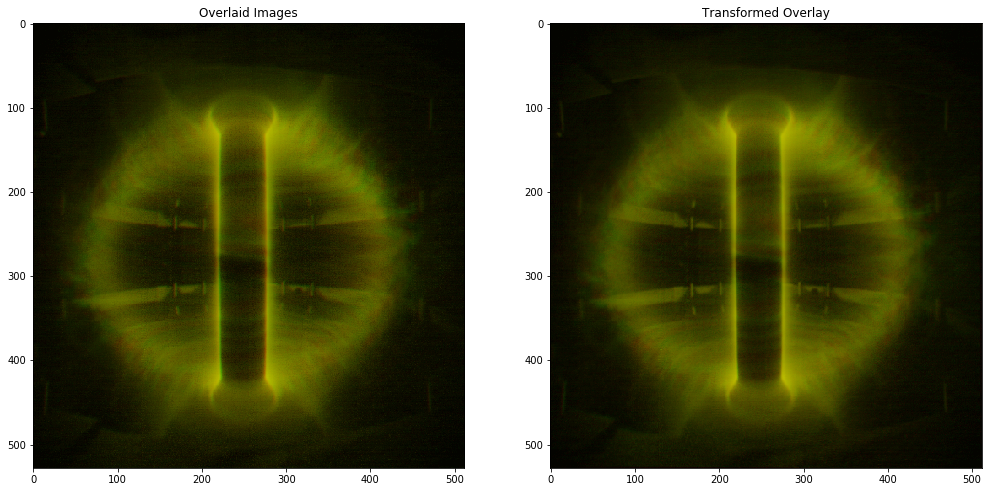

In [243]:
frame_num = 32

img_1 = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
img_2 = cv.imread(f'frames/1/frame_{frame_num+1}.png', cv.IMREAD_GRAYSCALE)

df = pd.read_csv(f'tests/1/{frame_num}_to_{frame_num+1}.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

# note here we reverse the order of the homography
# as these frames would be played chronologically
h_matrix, mask = cv.findHomography(after, before, method=cv.LMEDS)
transformed_img = cv.warpPerspective(img_2, h_matrix, dsize=(img_1.shape[1], img_1.shape[0]))

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(img_2)))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(transformed_img)))

plt.show()

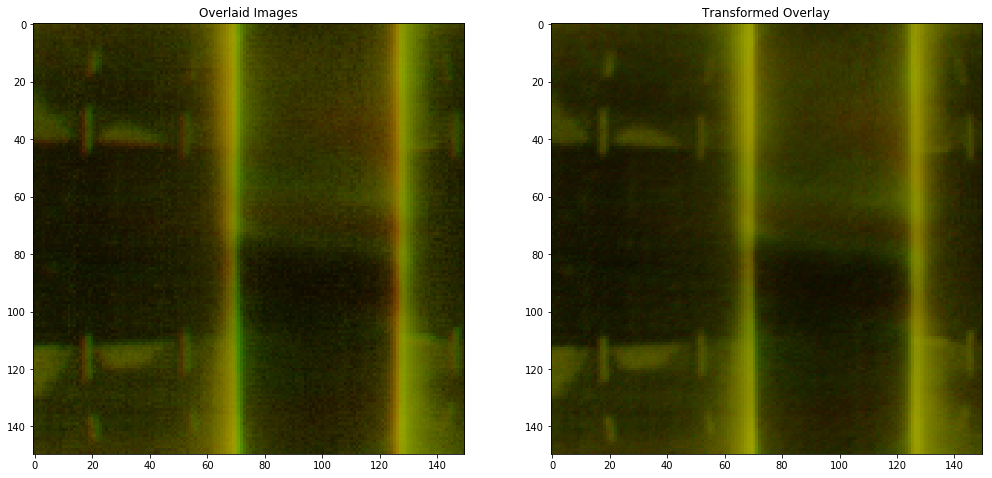

In [244]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(img_2))[200:350, 150:300])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(correct_contrast(img_1), correct_contrast(transformed_img))[200:350, 150:300])

plt.show()

# Continuous Matching

Here, we DeepMatch each frame to the next frame, and then transform the second frame to align it to the first.

Initial mistake: it is not sufficient to just DeepMatch each consectutive pair of images, as they will not be corrected relative to each other. We need to compute homographies and Deepmatches on the go!

In [2]:
import subprocess
from io import StringIO

In [57]:
data_path = '../data/real/MAST/pulse-1/processed'
max_scale_factor = 1.1
max_rotation_angle = 4

def deepmatch(img_id_1, img_id_2):
    
    # build command
    cmd = f'../deepmatching/deepmatching {img_id_1} {img_id_2} '
    cmd += f'-max_scale {max_scale_factor} '
    cmd += f'-rot_range 0 {max_rotation_angle}'
    cmd = cmd.split()
    
    # run
    process = subprocess.Popen(cmd,
                               stdout=subprocess.PIPE, 
                               stderr=subprocess.PIPE)

    # wait for the process to terminate
    out, err = process.communicate()
    out = StringIO(out.decode("utf-8"))
    df = pd.read_csv(out, sep=" ", header=None, names=['x_1','y_1','x_2','y_2','score','index'])
    
    before = df[['x_1','y_1']].values
    after = df[['x_2','y_2']].values
    
    return before, after


def transform_frame(before, after, frame_filename, output_label):
    
    # note here we reverse the order of the homography
    # as these frames would be played chronologically
    h_matrix, mask = cv.findHomography(after, before, method=cv.LMEDS)
    #h_matrix, mask = cv.findHomography(before, after, method=cv.LMEDS)
    
    # apply the homography
    #print(f'Transforming {frame_filename[-8:]}')
    frame = cv.imread(frame_filename, cv.IMREAD_GRAYSCALE)
    transformed = cv.warpPerspective(frame, h_matrix, dsize=frame.shape[::-1]) # for some reason need to reverse xy
    
    # save the result to an intermediate image
    if output_label is 'h':
        tf_frame_filename = frame_filename[:-6] + f'-{output_label}.png'
    else:
        tf_frame_filename = frame_filename[:-4] + f'-{output_label}.png'
    #print(f'New transformed: {tf_frame_filename[-8:-4]}')
    cv.imwrite(tf_frame_filename, transformed)

In [58]:
start_frame = 100
step = 1

start_frame_fn = path.join(data_path, f'{start_frame}.png')

# align the first image with itself
start_img = cv.imread(start_frame_fn, cv.IMREAD_GRAYSCALE)
cv.imwrite(path.join(data_path, f'{start_frame}-h.png'), start_img)
cv.imwrite(path.join(data_path, f'{start_frame}-i.png'), start_img)

True

In [ ]:
for frame_num in range(start_frame, 450, step):
    print(f'\nProcessing frame {frame_num}')
    
    # setup target filenames
    this_frame_fn = path.join(data_path, f'{frame_num}-h.png')
    next_frame_fn = path.join(data_path, f'{frame_num + step}.png')
    intermediate_frame_fname = next_frame_fn[:-4] + '-i.png'
    
    
    # perform local matching (to the next frame)
    #print(f'DeepMatching {frame_num}-h with {frame_num + step}')
    before, after = deepmatch(this_frame_fn, next_frame_fn)
    transform_frame(before, after, next_frame_fn, 'i')

    # perform global matching (to the start frame)
    #print(f'DeepMatching {start_frame} with {intermediate_frame_fname[-8:-4]}')
    before, after = deepmatch(start_frame_fn, intermediate_frame_fname)
    transform_frame(before, after, intermediate_frame_fname, 'h')

# Animations

In [3]:
import matplotlib.animation as animation
from matplotlib import animation, rc
from IPython.display import HTML, Image

# prevents things breaking
plt.rcParams['animation.ffmpeg_path'] = '/usr/local/bin/ffmpeg'

# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')

In [4]:
def overlay(img_1, img_2):
    
    if len(img_1.shape) == 3:
        overlay = np.zeros_like(img_1, dtype='uint8')
    else:
        overlay = np.zeros((img_1.shape[0], img_1.shape[1], 3), dtype='uint8')

    overlay[:,:,0] = img_1
    overlay[:,:,1] = img_2
    
    return overlay

In [10]:
results_path = '../data/real/MAST/pulse-1/processed'
start = 40
stop = 53
step = 1

In [48]:
start_frame = cv.imread(path.join(results_path, f'{start}.png'), cv.IMREAD_GRAYSCALE)

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(12,5))
plt.tight_layout(rect=[0, 0.0, 1, 0.99])

[ax.tick_params(bottom=False,
                left=False,
                labelbottom=False,
                labelleft=False) for ax in (ax1, ax2, ax3)]

ax1.set_title('Original')
ax2.set_title('Stabilised')
ax3.set_title('Overlay')

im1 = ax1.imshow(start_frame, animated=True)
im2 = ax2.imshow(start_frame, animated=True)
im3 = ax3.imshow(start_frame, animated=True)
plt.close()


def next_frame(i):
    frame_num = i + start
    #print(frame_num)
    fig.suptitle('  MAST Pulse Alignment', fontsize=15, weight=600)
    fig.text(0.475,0.02,f'Frame {frame_num}', fontsize=12, weight=60,
             bbox=dict(facecolor='white', alpha=1.0, edgecolor='white'))
    
    img_filename = path.join(results_path, f'{frame_num}.png')
    
    img_o = cv.imread(img_filename, cv.IMREAD_GRAYSCALE)
    im1.set_array(img_o)
    
    img_h = cv.imread(img_filename[:-4]+'-h.png', cv.IMREAD_GRAYSCALE)
    im2.set_array(img_h)
    
    im3.set_array(overlay(img_o, img_h))
    
    return im1,im2,im3,



ani = animation.FuncAnimation(fig, next_frame, interval=150, frames=stop - start)
ani

In [101]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=13, metadata=dict(artist='Me'), bitrate=5000)
ani.save('17-to-300.mp4', writer=writer, dpi=200)

# Centre Column Detection

While DeepMatching does a good job of fixing the shakes in the first few seconds of the video, we ran into some problems with long term drift. Maybe if we can reliably track some other feature in the image we can use this a point of reference to map each frame back to, any so avoid drift.

We'll go back to our trusty OpenCV LSD to try and track the centre column.

In [13]:
def lsd(img, scale=None, sigma_scale=None, return_bin=False, return_lines=False):
    """wrapper for opencv's line segment detection functionality"""
    
    # if we don't specify parameters, leave the defaults
    if scale is None and sigma_scale is None:
        lsd = cv.createLineSegmentDetector(_refine=cv.LSD_REFINE_STD)
    
    # otherwise use our settings
    else:
        lsd = cv.createLineSegmentDetector(_refine=cv.LSD_REFINE_STD,
                                            _scale=scale,
                                            _sigma_scale=scale)
        
    # detect line segments
    _lines, width, prec, nfa = lsd.detect(img) 
    

    if return_lines:
        # just return a numpy array of line
        return np.squeeze(_lines)
    
    if return_bin:
        # return a binary image of the lines
        bin_lines = np.zeros_like(img)
        bin_lines = lsd.drawSegments(bin_lines, _lines)
        bin_lines = cv.cvtColor(bin_lines, cv.COLOR_BGR2GRAY)
        return bin_lines
    
    else:
        # draw lines on top of the preprocessed image
        return lsd.drawSegments(img, _lines)

## Unpreprocessed

Here is LSD on the raw video. The LSD does a pretty good job, but with preprocessing we can do better.

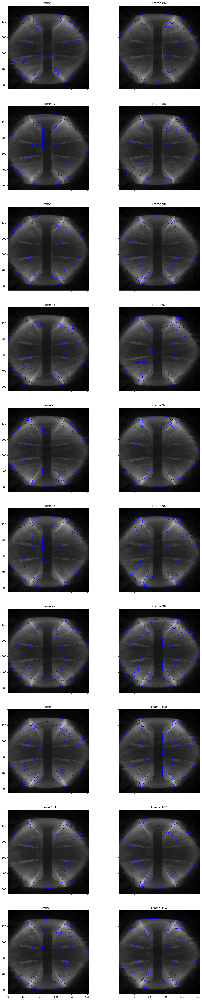

In [427]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 85

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
        lines = lsd(img, 0.4, 0.6)
        axs[i,j].imshow(lines)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 1

## Standard Filters

Here our some old OpenCV wrappers for preprocessing

In [14]:
def correct_contrast(img, clip_limit=2.5, tile_size=100):
    
    # create the object
    clahe = cv.createCLAHE(clipLimit=clip_limit, 
                            tileGridSize=(tile_size, tile_size))
    
    # apply equalisation
    return clahe.apply(img)

# wrap opencv functions so they are compatible with plots
def bilateral_filter(img, filter_size=5, sigma=70):
    
    # it's not clear exactly what the parameters represent in the docs...
    # (the sigmaSpace parameter appears to be superfluous)
    return cv.bilateralFilter(img, d=filter_size,
                               sigmaColor=sigma,
                               sigmaSpace=sigma)

def nlm_filter(img, strength=30, window_size=20):
    return cv.fastNlMeansDenoising(img, h=strength, searchWindowSize=window_size)

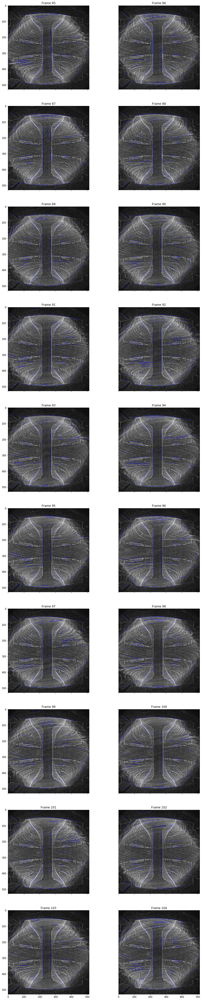

In [424]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 85

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = correct_contrast(cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE))
        #img = nlm_filter(img)
        #img = bilateral_filter(img)
        lines = lsd(img, 0.2, 0.7)
        # plot image with these parameters
        axs[i,j].imshow(lines)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 1

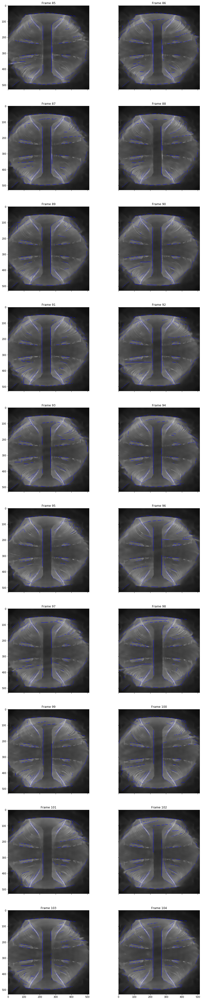

In [425]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 85

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = correct_contrast(cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE))
        img = nlm_filter(img)
        #img = bilateral_filter(img)
        lines = lsd(img, 0.2, 0.7)
        # plot image with these parameters
        axs[i,j].imshow(lines)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 1

## Thresholding

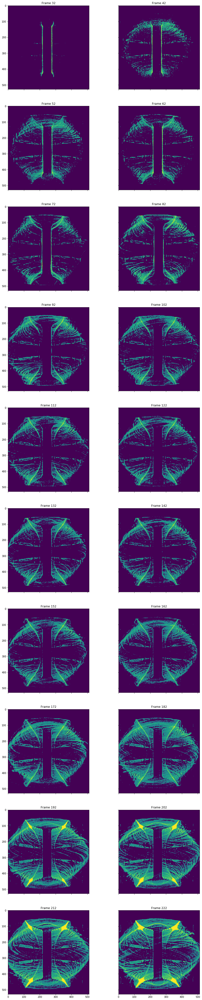

In [95]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 32

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = correct_contrast(cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE))
        ret,thresh = cv.threshold(img,100,255,cv.THRESH_TOZERO)

        axs[i,j].imshow(thresh)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 10

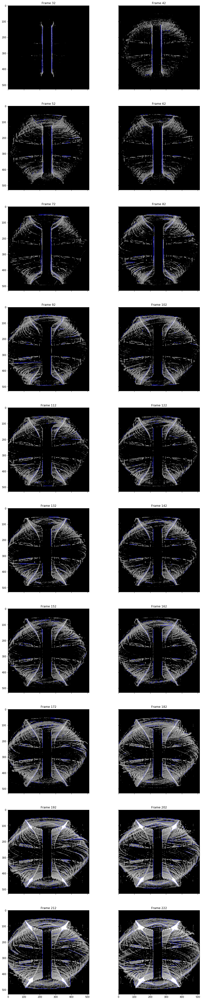

In [96]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 32

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = correct_contrast(cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE))
        ret,thresh = cv.threshold(img,100,255,cv.THRESH_TOZERO)
        lines = lsd(thresh, 0.2, 0.7)
        axs[i,j].imshow(lines)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 10

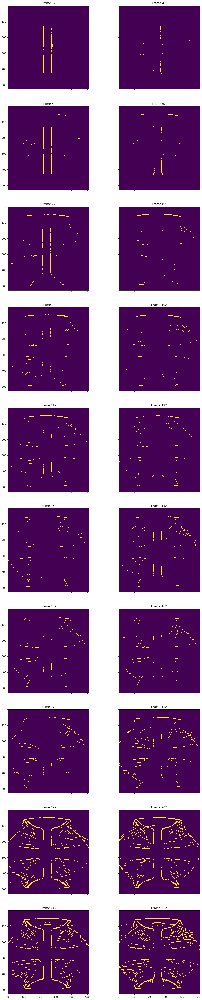

In [135]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 32

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
        thresh = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,cv.THRESH_BINARY_INV,19,5)
        median = cv.medianBlur(thresh,3)
        lines = lsd(thresh, 0.2, 0.7)
        axs[i,j].imshow(median)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 10

# Implement

Let's combine the above results into something usable. We will be greedy and preprocess every frame in parallel using all the methods above, then perform LSD on each, and then combine the lines at the end. Note that we probably can get adequate results without doing all this and just selecting one/a few pp operations to do in parallel...

## Building the Feature Detector

In [9]:
img = cv.imread(f'frames/1/frame_{12}.png', cv.IMREAD_GRAYSCALE)

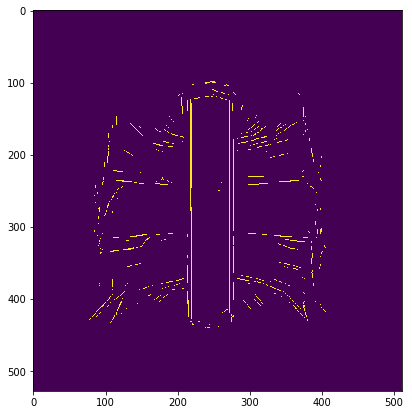

In [15]:
def raw(img):
    return img

def contrast(img):
    return correct_contrast(img, clip_limit=2.5, tile_size=100)

def contrast_nlm(img):
    img = correct_contrast(img, clip_limit=2.5, tile_size=100)
    return nlm_filter(img, strength=30, window_size=20)

def constrast_threshold(img):
    img = correct_contrast(img, clip_limit=2.5, tile_size=100)
    return cv.threshold(img, 100, 255, cv.THRESH_TOZERO)[1]

def adpt_threshold_median(img):
        thresh = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,cv.THRESH_BINARY_INV,19,5)
        return cv.medianBlur(thresh,3)

def do_all(img):
    return np.array([raw(img),
            contrast(img),
            contrast_nlm(img),
            constrast_threshold(img),
            adpt_threshold_median(img)])



def get_lines(img):
    imgs = do_all(img)
    all_lines = np.asarray([lsd(img, 0.5, 0.7, return_bin=True) for img in imgs])
    aggregate = all_lines.sum(axis=0)/5
    aggregate = cv.threshold(aggregate, 19, 255, cv.THRESH_BINARY)[1]
    return aggregate.astype('uint8')


aggregate = get_lines(img)
plt.figure(figsize=(7,7))
plt.imshow(aggregate)

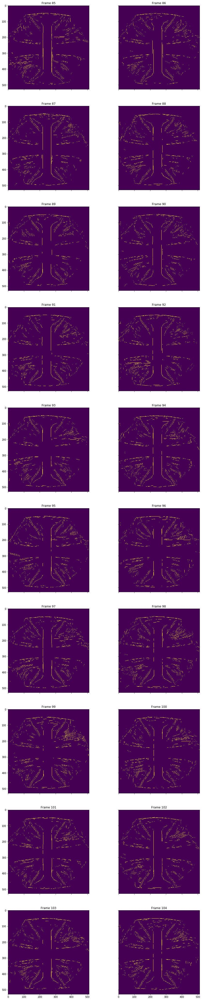

In [433]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 85

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
        aggregate = get_lines(img)
        axs[i,j].imshow(aggregate)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 1

In [16]:
# opencv compatibility
def parse_lines(lines_in):
    if cv.__version__ < '3.0':
        return lines_in[0]
    return [l[0] for l in lines_in]

def merge_lines(img, p1, p2, minLineLength=20, maxLineGap=30, return_lines=False):
    
    merged_lines = cv.HoughLinesP(img, rho=p1, theta=2*np.pi/180, 
                             threshold=p2, minLineLength=minLineLength, 
                             maxLineGap=maxLineGap)
    
    lines = [[leftx, boty, rightx, topy] for leftx, boty, rightx, topy in parse_lines(merged_lines) 
             if abs(leftx - rightx) == 0 and leftx > 200 and leftx < 300] # ZERO TOLERANCE
    
    # return line information
    if return_lines:
        return np.array(lines)
    
    # or return drawn lines 
    img_with_merged_lines = np.zeros_like(img)

    for line in lines:
        leftx, boty, rightx, topy = line
        #if abs(leftx - rightx) < 4 and leftx > 200 and leftx < 300:
        cv.line(img_with_merged_lines, (leftx, boty), (rightx,topy), (255, 255, 0), 1)
    
    return img_with_merged_lines

def overlay(img_1, img_2):
    
    if len(img_1.shape) == 3:
        overlay = np.zeros_like(img_1, dtype='uint8')
    else:
        overlay = np.zeros((img_1.shape[0], img_1.shape[1], 3), dtype='uint8')

    overlay[:,:,0] = img_1
    overlay[:,:,1] = img_2
    
    return overlay

def overlay_gs(img_1, img_2):
    overlay = img_1.copy()
    overlay[img_2 != 0] = 255
    return overlay

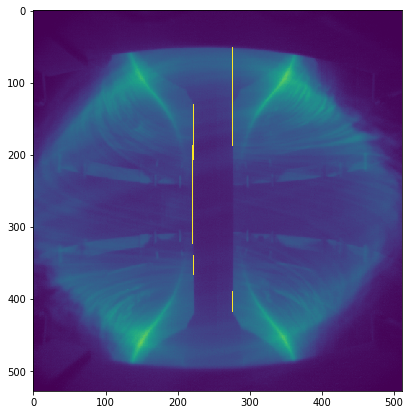

In [11]:
img = cv.imread('../data/real/MAST/pulse-1/100.png', cv.IMREAD_GRAYSCALE)
merged = merge_lines(get_lines(img), 1, 20, minLineLength=10, maxLineGap=50)
plt.figure(figsize=(7,7))

plt.imshow(overlay_gs(img, merged))

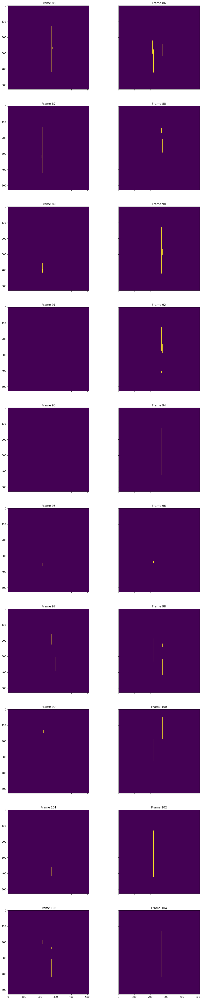

In [498]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 85

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
        merged = merge_lines(get_lines(img), 2, 20, minLineLength=10, maxLineGap=50)
        axs[i,j].imshow(merged)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 1

Filtering Operations on lines:
- Sometimes we get double lines due to a dark/bright/dark patter due to the frings of plasma around the centre column. We just keep the closest two lines from the LHS and RHS (the assumption is that we never detect erroneous lines inside the column which seems safe-ish).
- Reject any lines that are not vertical. This was done just to make the coding simple and is not necesary, though some small tolerance around a vertical line is probably necessary (to reject all the horizontal etc lines that obviously have nothing to do with the centre column).

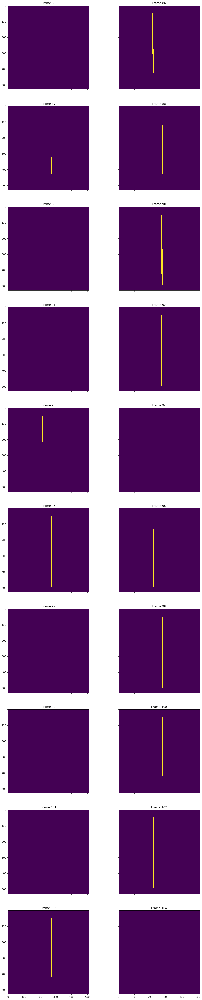

In [696]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 85

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
        merged = merge_lines(merge_lines(get_lines(img), 1, 20, 10, 100), 1, 20, 100, 250)
        axs[i,j].imshow(merged)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 1

In [697]:
test = 315
img = cv.imread(f'frames/1/frame_{test}.png', cv.IMREAD_GRAYSCALE)
merged = merge_lines(merge_lines(get_lines(img), 1, 20, 10, 100), 1, 20, 100, 250, return_lines=True)

In [18]:
from itertools import combinations, product

def keep_closest(lines, img_width):
    """
    Keep the closest two lines (one of each from the LHS and RHS of the centre column).
    This deals with fringes where lines are detected close to each other.
    We could probably do this better by just averaging those lines which
    are very close to each other.
    """
    
    # separate left and right lines
    lh = lines[lines[:,0] < img_width/2 + 3] # add manual offset because the column is not centered
    rh = lines[lines[:,0] > img_width/2 + 3] # add manual offset because the column is not centered

    lh_x = lh[:,0]
    rh_x = rh[:,0]
    
    # filter by median
    lh_median = np.median(lh_x)
    rh_median = np.median(rh_x)
    
    lh_x = lh_x[np.abs(lh_x - lh_median) < 10]
    rh_x = rh_x[np.abs(rh_x - rh_median) < 10]
    
    if len(lh_x) == 0 or len(rh_x) == 0 :
        print('oops filtered evervything')
        return [[0,0,0,0],[0,0,0,0]]
    
    pairs = list(product(lh_x, rh_x))
    separations = [abs(pair[0] - pair[1]) for pair in pairs]
    # check separation of every combination of left and right lines 

    # find the minimum separation
    min_index = separations.index(min(separations))

    min_x_coords = list(pairs)[min_index]
    
    lh_filtered = lh[lh[:,0] == min_x_coords[0]]
    rh_filtered = rh[rh[:,0] == min_x_coords[1]]
    
   
    return np.concatenate((lh_filtered, rh_filtered))
    
#keep_closest(merged, img.shape[1])

In [19]:
from itertools import combinations, product

### Don't use this
def keep_closest_old(lines, img_width):

    # separate left and right lines
    lh = lines[lines[:,0] < img_width/2]
    rh = lines[lines[:,0] > img_width/2]
    
    lh_x = lh[:,0]
    rh_x = rh[:,0]
    # check separation of every combination of left and right lines 
    m = np.hstack((np.vstack((lh_x, rh_x)), np.vstack((lh_x, rh_x[::-1]))))
    separations = [np.abs(comb[0] - comb[1]) for comb in combinations(m, 2)][0]
    print(seperations)
    # find the minimum separation
    min_index = separations.argmin()
    min_x_coords = m[:,min_index]
    min_x_coords.sort()
    print(min_x_coords)
    lh_filtered = lh[lh[:,0] == min_x_coords[0]]
    rh_filtered = rh[rh[:,0] == min_x_coords[1]]
    
   
    return np.concatenate((lh_filtered, rh_filtered))
    
#keep_closest(merged, img.shape[1])

In [20]:
def get_column_outline(img):
    """
    Detect and merge lines (using the probabistic Hough transform) for a frame.
    Then filter the lines, just keepin the cloest pair.
    """
    # note that we do a Hough transform twice!!
    # note also that doing this introduces many tunable parameters which
    # have been manually tuned here (bare in mind that they are constant over the
    # whole video which has a lot of visual variation in it, so performance is not
    # overly sensitive on getting these exactly right)
    merged =  merge_lines(merge_lines(get_lines(img), 1, 20, 10, 100), 1, 20, 100, 250, return_lines=True)
    filtered = keep_closest(merged, img.shape[1])
    if len(filtered) != 2:
        print('watch out!')
    return filtered[0], filtered[1]
    
    
def draw_centre_column(img, lines):
    """
    Given an image and some lines that have been detected in that image,
    draw those lines on top of the original image.
    """
    img = np.zeros_like(img)# dtype='uint8')

    for line in lines:
        leftx, boty, rightx, topy = line
        #print(leftx)
        cv.line(img, (leftx, 450), (rightx,100), (255, 255, 0), thickness=1, lineType=cv.LINE_AA)
        
    return img

# Putting it All Together

Go through the whole video and process it.

In [ ]:
results_path = '../data/real/MAST/pulse-1/processed'
start = 9
stop = 400
step = 1

start_frame = cv.imread(path.join(results_path, f'{start}.png'), cv.IMREAD_GRAYSCALE)

fig = plt.figure(figsize=(9,9))
ax = plt.gca()
ax.tick_params(bottom=False,
                left=False,
                labelbottom=False,
                labelleft=False)

ax.set_title('Centre Column Detection')
start_lines = get_column_outline(start_frame)

start_img = draw_centre_column(start_frame, start_lines)
im = ax.imshow(overlay_gs(start_frame, start_img), animated=True)
plt.close()

lh_old = None
rh_old = None

def next_frame(i):
    global lh_old
    global rh_old
    frame_num = i + start
    print(frame_num)
    fig.suptitle('  MAST Pulse Alignment', fontsize=15, weight=600)
    fig.text(0.475,0.02,f'Frame {frame_num}', fontsize=12, weight=60,
             bbox=dict(facecolor='white', alpha=1.0, edgecolor='white'))
    
    img_filename = path.join(results_path, f'{frame_num}.png')
    img = cv.imread(img_filename, cv.IMREAD_GRAYSCALE)
    lh, rh = get_column_outline(img)
    if lh[0] == 0:
        print('reusing lh')
        lh = lh_old
    if rh[0] == 0:
        print('reusing rh')
        rh = rh_old
        
    col = draw_centre_column(img, [lh, rh])
    
    lh_old = lh
    rh_old = rh

    im.set_array(overlay_gs(img, col))
    #im.set_array(col)
    
    return im,



ani = animation.FuncAnimation(fig, next_frame, interval=100, frames=stop - start)
ani

In [ ]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=16, metadata=dict(artist='Me'), bitrate=-1)
ani.save('center-col-final2med111.mp4', writer=writer, dpi=200)

In [678]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=16, metadata=dict(artist='Me'), bitrate=-1)
ani.save('center-col-final200-116.mp4', writer=writer, dpi=200)

## Translation Correction

In [53]:
def column_midpoint(lines):
    """
    Just return the midpoint of the two lines that are detected,
    i.e. the coordinate which represents the middle of the centre column.
    """
    if len(lines) == 2:
        return (lines[0][0] + lines[1][0]) / 2
    else:
        print("ERROR: didn't detect two nice clean lines!")
        return None
    
def translate_img(img, x_displacement):
    """
    Translate an image in X
    """
    
    rows,cols = img.shape

    M = np.float32([[1,0,-x_displacement],[0,1,0]])
    img_copy = img.copy()
    dst = cv.warpAffine(img_copy, M, (cols,rows))
    return dst

In [ ]:
start_frame = cv.imread(path.join(results_path, f'{start}.png'), cv.IMREAD_GRAYSCALE)

In [74]:
results_path = '../data/real/MAST/pulse-1/processed'
start = 10
stop = 300
step = 1


start_frame = cv.imread(path.join(results_path, f'{start}.png'), cv.IMREAD_GRAYSCALE)





fig, (ax1, ax2) = plt.subplots(1,2, figsize=(11,7))
plt.tight_layout(rect=[0, 0.0, 1, 0.99])

[ax.tick_params(bottom=False,
                left=False,
                labelbottom=False,
                labelleft=False) for ax in (ax1, ax2)]

ax1.set_title('Original Tracked Image')
ax2.set_title('Stabilised in $x$')

start_lines = get_column_outline(start_frame)
start_midpoint = column_midpoint(start_lines)
start_img_lines = draw_centre_column(start_frame, start_lines)

im1 = ax1.imshow(start_frame, animated=True)
im2 = ax2.imshow(start_img_lines, animated=True)

plt.close()



lh_old = None
rh_old = None

def next_frame(i):
    global lh_old
    global rh_old
    frame_num = i + start
    print(frame_num)
    fig.suptitle('MAST Pulse $x$-Alignment', fontsize=15, weight=600)
    fig.text(0.475,0.1,f'Frame {frame_num}', fontsize=12, weight=60,
             bbox=dict(facecolor='white', alpha=1.0, edgecolor='white'))
    
    img_filename = path.join(results_path, f'{frame_num}.png')
    img = cv.imread(img_filename, cv.IMREAD_GRAYSCALE)
    lh, rh = get_column_outline(img)
    
    if lh[0] == 0:
        print('reusing lh')
        lh = lh_old
    if rh[0] == 0:
        print('reusing rh')
        rh = rh_old
    
    col_midpoint = column_midpoint([lh,rh])
    this_delta_x = col_midpoint - start_midpoint

    translated = translate_img(img, this_delta_x)
    col = draw_centre_column(img, [lh, rh])
    
    lh_old = lh
    rh_old = rh
    
    #img = (255)/(img.max()-img.min())*(img-img.min())
    #translated = (255)/(translated.max()-translated.min())*(translated-translated.min())
    
    im1.set_data(overlay_gs(img, col))
    
    #translated = (255)/(translated.max()-translated.min())*(translated-translated.min())
    im2.set_data(translated)
    
    return im,



ani = animation.FuncAnimation(fig, next_frame, interval=120, frames=stop - start)
#ani

In [ ]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=29, metadata=dict(artist='Me'), bitrate=-1)
ani.save('center-col-x-stabilisation2.mp4', writer=writer, dpi=300)

# Tracking y

More difficult, unfinished...

In [157]:
def merge_lines_y(img, p1, p2, minLineLength=20, maxLineGap=30, return_lines=False):
    
    merged_lines = cv.HoughLinesP(img, rho=p1, theta=10*np.pi/180, 
                             threshold=p2, minLineLength=minLineLength, 
                             maxLineGap=maxLineGap)
    
    lines = [[leftx, boty, rightx, topy] for leftx, boty, rightx, topy in parse_lines(merged_lines) 
             if abs(topy - boty) < 20 and abs(leftx - rightx) > 2 and boty > 200 and topy < 350] # ZERO TOLERANCE
    
    # return line information
    if return_lines:
        return np.array(lines)
    
    # or return drawn lines 
    img_with_merged_lines = np.zeros_like(img)

    for line in lines:
        leftx, boty, rightx, topy = line
        #if abs(leftx - rightx) < 4 and leftx > 200 and leftx < 300:
        cv.line(img_with_merged_lines, (leftx, boty), (rightx,topy), (255, 255, 0), 1)
    
    return img_with_merged_lines.copy()



def get_lines_y(img):
    imgs = do_all(img)
    all_lines = np.asarray([lsd(img, 0.5, 0.7, return_bin=True) for img in imgs])
    aggregate = all_lines.sum(axis=0)/5
    aggregate = cv.threshold(aggregate, 10, 255, cv.THRESH_BINARY)[1]
    return aggregate.astype('uint8')

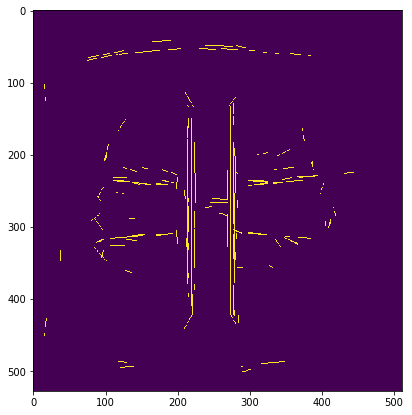

In [158]:
img = cv.imread('../data/real/MAST/pulse-1/20.png', cv.IMREAD_GRAYSCALE)

#merged = merge_lines_y(get_lines_y(img), 1, 1, minLineLength=60, maxLineGap=60)
merged = get_lines_y(img)

plt.figure(figsize=(7,7))

plt.imshow(merged)

In [225]:
def adpt_threshold_median_y(img):
        thresh = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,cv.THRESH_BINARY_INV,15,1)
        return cv.medianBlur(thresh,3)
    
def adpt_threshold_median_y2(img):
        thresh = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,cv.THRESH_BINARY_INV,5,2)
        return cv.medianBlur(thresh,3)

In [ ]:
rows = 10
cols = 2

# set up axes
fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols,
                        sharex='col', sharey='row',
                        figsize=(15,75))
# formatting
#fig.subplots_adjust(hspace=0.01, wspace=0.01)
count = 0
start_frame = 20

# loop through axes and make each plot
for i in range(rows):        
    for j in range(cols):
        frame_num = start_frame + count
        img = cv.imread(f'frames/1/frame_{frame_num}.png', cv.IMREAD_GRAYSCALE)
        merged = adpt_threshold_median_y2(adpt_threshold_median_y(img))

        axs[i,j].imshow(merged)
        axs[i,j].set_title(f'Frame {frame_num}')
        count += 10